In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
def mergeImages():
  import matplotlib.pyplot as plt
  import numpy as np
  edge_dir = "/content/drive/My Drive/M499/3"
  original_dir = "/content/drive/My Drive/M499/tranch3/tranch3"
  import os
  for ori in sorted(os.listdir(original_dir)):
    ori_img = plt.imread(os.path.join(original_dir,ori))
    file_name = ori.rsplit(".")[0]
    edge_img = None
    for edge in sorted(os.listdir(edge_dir)):
      edge_file_name = edge.rsplit(".")[0]
      if (edge_file_name == file_name):
        edge_img = plt.imread(os.path.join(edge_dir, edge))
        break
    if edge_img is not None:
      X = np.zeros(edge_img.shape + (4,))
      X[...,:3] = ori_img
      X[...,-1] = edge_img
      try:
        plt.imsave("/content/drive/My Drive/M499/merge3/" + file_name + ".png", X)
      except ValueError as e: # 0-255 as jpg, but should be 0-1
        X = np.zeros(edge_img.shape + (4,))
        X[...,:3] = ori_img / 255
        X[...,-1] = edge_img / 255
        plt.imsave("/content/drive/My Drive/M499/merge3/" + file_name + ".png", X)
    else:
      print(ori, "not found")

# import

In [ ]:
# !unrar e '/content/drive/My Drive/M499/edge/tranch2_edge.rar' '/content/drive/My Drive/M499/edge'

In [ ]:
# !mkdir /content/drive/My\ Drive/M499/data

In [ ]:
# !unzip /content/drive/My\ Drive/M499/persons-posture-tranch1.zip -d /content/drive/My\ Drive/M499/data

In [ ]:
from zipfile import ZipFile
import matplotlib.pyplot as plt
import tensorflow as tf
import albumentations as A
from tensorflow.keras import datasets, layers, models
import numpy as np
!pip install git+https://github.com/mjkvaak/ImageDataAugmentor
from ImageDataAugmentor.image_data_augmentor import *
import seaborn as sns
import pandas as pd
# !pip install decord
# import decord
import torch
from torchvision import transforms
# !pip install facenet-pytorch
# from facenet_pytorch import MTCNN

  Cloning https://github.com/mjkvaak/ImageDataAugmentor to /tmp/pip-req-build-d00o45y1
  Running command git clone -q https://github.com/mjkvaak/ImageDataAugmentor /tmp/pip-req-build-d00o45y1
     |████████████████████████████████| 49.5MB 62kB/s 
  Created wheel for ImageDataAugmentor: filename=ImageDataAugmentor-0.0.0-cp36-none-any.whl size=28028 sha256=65425708cbaa761fab9e80db4b361f99ecce118f6b55df360cfe765cd40884c9
  Stored in directory: /tmp/pip-ephem-wheel-cache-3p16_bts/wheels/d9/10/55/6fca35a4072f87d694876d56ece64db3846cf45e1da1c381fe
Successfully built ImageDataAugmentor
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: opencv-python 4.1.2.30
    Uninstalling opencv-python-4.1.2.30:
      Successfully uninstalled opencv-python-4.1.2.30


# team2net

In [ ]:
merge_dir = "/content/drive/My Drive/M499/merge3/"
tranch = 3
labels_path = '/content/drive/My Drive/M499/tranch'+str(tranch)+'_labels.csv'
pictures_path = '/content/drive/My Drive/M499/persons-posture-tranch'+str(tranch)+'.zip'

labels = pd.read_csv(labels_path)
zip_file = ZipFile(pictures_path)

file_list = [obj.filename for obj in zip_file.infolist()]
file_list_simple = [name.split('/')[-1] for name in file_list]

In [ ]:
df = labels
len(df)

11167

In [ ]:
df["final_url"] = df["final_url"].str.replace("PNG", 'png')
df["final_url"] = df["final_url"].str.replace("JPG", 'png')

In [ ]:
df = df.dropna()
df.index = range(len(df))
df["primary_posture"].value_counts()

Standing    6853
Sitting     2495
Lying        941
Unknown      508
Name: primary_posture, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.33, random_state=42)
train = train.query("primary_posture != 'Unknown'")
test = test.query("primary_posture != 'Unknown'")
len(train), len(test)

(6871, 3418)

In [ ]:
train["primary_posture"] .value_counts() / len(train)

Standing    0.668898
Sitting     0.242759
Lying       0.088342
Name: primary_posture, dtype: float64

In [ ]:
test["primary_posture"] .value_counts()  / len(test)

Standing    0.660328
Sitting     0.241954
Lying       0.097718
Name: primary_posture, dtype: float64

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                            shear_range=0.1,
                            zoom_range=0.1,
                            width_shift_range=0.1,
                            height_shift_range=0.1,
                            brightness_range=[0.9,1.1],
                            horizontal_flip=True,
                            validation_split=0.2,
                            # preprocessing_function=custom_preprocess
)

val_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                            #  preprocessing_function= mobilenet_v2.preprocess_input
)

test_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                            #  preprocessing_function= mobilenet_v2.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/merge3/",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            color_mode="rgba",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/merge3/",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            color_mode="rgba",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)


test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/merge3/",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            color_mode="rgba",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 5 invalid image filename(s) in x_col="final_url". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 5493 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 4 invalid image filename(s) in x_col="final_url". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 1373 validated image filenames belonging to 3 classes.
Found 3412 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/dataframe_iterator.py:282: UserWarning: Found 6 invalid image filename(s) in x_col="final_url". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [ ]:
import tensorflow as tf
import numpy as np


class team2netBlock(tf.keras.layers.Layer):
    def __init__(self, filter_num, stride):
        super().__init__()

        self.conv1 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=stride,
                                            padding='same', name='block_conv1', input_shape=(56, 56, 3))
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.conv2 = tf.keras.layers.Conv2D(filters=filter_num,
                                            kernel_size=(3, 3),
                                            strides=1,
                                            padding='same', name='block_conv2', input_shape=(56, 56, filter_num))
        self.bn2 = tf.keras.layers.BatchNormalization()

        if stride != 1:
            self.downsample = tf.keras.Sequential()
            self.downsample.add(tf.keras.layers.Conv2D(filters=1,
                                                       kernel_size=(1, 1),
                                                       strides=stride))
            self.downsample.add(tf.keras.layers.BatchNormalization())
        else:
            self.downsample = lambda x: x

    # @tf.function
    def call(self, inputs: list, training=None):
        x, residual = inputs[0], inputs[1]
        residual = self.downsample(residual)
        x = self.conv1(x)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.conv2(x)
        x = self.bn2(x, training=training)
        x = tf.nn.relu(x)
        output = tf.nn.relu(tf.keras.layers.add([residual, x]))
        return output, residual

    def get_config(self):
        cfg = super().get_config()
        return cfg    

class team2net(tf.keras.Model):
    def __init__(self, layer_params):
        super().__init__()
        self.layer_params = layer_params
        self.conv1 = tf.keras.layers.Conv2D(filters=64,
                                            kernel_size=(7, 7),
                                            strides=2,
                                            padding="same")
        self.convEdge = tf.keras.layers.Conv2D(filters=1,
                                               kernel_size=(7, 7),
                                               strides=2,
                                               padding="same", name='convEdge')
        self.bn1 = tf.keras.layers.BatchNormalization()
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(3, 3),
                                               strides=2,
                                               padding="same")

        self.avgpool = tf.keras.layers.GlobalAveragePooling2D()
        self.fc = tf.keras.layers.Dense(3, activation=tf.keras.activations.softmax)

    def resblock(self, inputs, residual, filter_num, blocks, stride):
        inputs, residual = team2netBlock(filter_num, stride=stride)([inputs, residual])
        for i in range(1, blocks):
            inputs, residual = team2netBlock(filter_num, stride=1)([inputs, residual])
        return inputs, residual


    def call(self, inputs, training=None):
        x = tf.keras.layers.Lambda(lambda x: x[..., :3])(inputs)
        residual = tf.keras.layers.Lambda(lambda x: tf.expand_dims(x[..., -1], -1))(inputs)
        x = self.conv1(x)
        x = self.bn1(x, training=training)
        x = tf.nn.relu(x)
        x = self.pool1(x)
        residual = self.convEdge(residual)
        residual = self.pool1(residual)

        # start skip
        x, residual = self.resblock(x, residual, filter_num=64,
                                    blocks = self.layer_params[0], stride =1)

        x, residual = self.resblock(x, residual, filter_num=128,
                                    blocks = self.layer_params[1], stride =2)

        x, residual = self.resblock(x, residual, filter_num=256,
                                    blocks = self.layer_params[2], stride =2)

        x, residual = self.resblock(x, residual, filter_num=512,
                                    blocks = self.layer_params[3], stride =2)

        x = self.avgpool(x)
        output = self.fc(x)
        return output

    def model(self):
        x = tf.keras.Input(shape=(224, 224, 4))
        return tf.keras.Model(inputs=[x], outputs=self.call(x))


team2net34 = team2net([3, 4, 6, 3]).model()

In [ ]:
from tensorflow.keras import optimizers, losses
team2net34.build(input_shape=(None, 224, 224, 4))
team2net34.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])
team2net34.summary()

Model: "functional_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 4) 0                                            
__________________________________________________________________________________________________
lambda_4 (Lambda)               (None, 224, 224, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 112, 112, 64) 9472        lambda_4[0][0]                   
__________________________________________________________________________________________________
batch_normalization_72 (BatchNo (None, 112, 112, 64) 256         conv2d_8[0][0]                   
_______________________________________________________________________________________

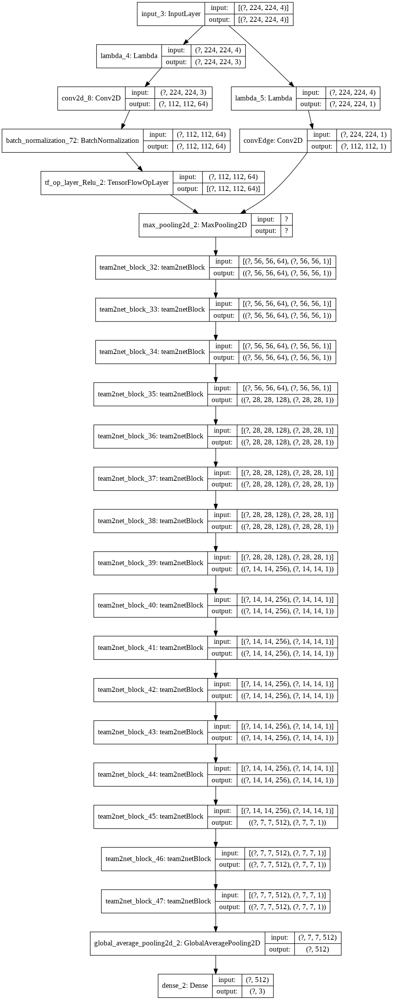

In [ ]:
tf.keras.utils.plot_model(team2net34, show_shapes=True)

In [ ]:
def train_model(model):
  from datetime import datetime
  import json
  
  save_dir = "/content/drive/My Drive/model/team2net"
 
  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)
 
  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 13,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  

  txt_log = open(save_dir+".log", mode='wt', buffering=1)
  
  log_callback = tf.keras.callbacks.LambdaCallback(
    on_epoch_end = lambda epoch, logs: txt_log.write(
      json.dumps({'epoch': epoch, 'loss': logs['loss']}) + '\n'),
    on_train_end = lambda logs: txt_log.close()
  )


  his = model.fit(train_gen, 
      steps_per_epoch=171,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_accuracy:.2f}.h5'),
                 early_stopper, reduce_lr,
                 log_callback,
                 ],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 42,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()
  plt.savefig(save_dir + "plot.jpg")
 
  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour)
 
  model.save(save_dir)
train_model(team2net34)

Epoch 1/60
171/171 [==============================] - 173s 1s/step - loss: 0.8407 - accuracy: 0.6590 - val_loss: 1.9019 - val_accuracy: 0.1823
Epoch 2/60
171/171 [==============================] - 170s 997ms/step - loss: 0.7988 - accuracy: 0.6651 - val_loss: 1.1303 - val_accuracy: 0.3021
Epoch 3/60
171/171 [==============================] - 170s 993ms/step - loss: 0.7903 - accuracy: 0.6643 - val_loss: 1.4196 - val_accuracy: 0.2686
Epoch 4/60
171/171 [==============================] - 172s 1s/step - loss: 0.7915 - accuracy: 0.6706 - val_loss: 1.0132 - val_accuracy: 0.4226
Epoch 5/60
171/171 [==============================] - 171s 999ms/step - loss: 0.7739 - accuracy: 0.6777 - val_loss: 0.7604 - val_accuracy: 0.6808
Epoch 6/60
171/171 [==============================] - 169s 988ms/step - loss: 0.7597 - accuracy: 0.6812 - val_loss: 0.7682 - val_accuracy: 0.6756
Epoch 7/60
 33/171 [====>.........................] - ETA: 1:59 - loss: 0.7424 - accuracy: 0.6894

# tranch 1

In [ ]:
labels_path = '/content/drive/My Drive/M499/tranch2_labels.csv'
labels = pd.read_csv(labels_path)

In [ ]:
labels["final_url"][0]

'ec55e8426394d29a099384655db0c431813245a24cdebcbbc151e526de1ea7e8_cat-1_003.png'

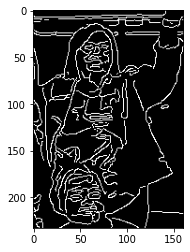

In [ ]:
img = cv2.imread("/content/drive/My Drive/M499/edge/" + labels["final_url"][0])
plt.imshow(img)

In [ ]:
tranch = 1
labels_path = '/content/drive/My Drive/M499/tranch'+str(tranch)+'_labels.csv'
pictures_path = '/content/drive/My Drive/M499/persons-posture-tranch'+str(tranch)+'.zip'

labels = pd.read_csv(labels_path)
zip_file = ZipFile(pictures_path)

file_list = [obj.filename for obj in zip_file.infolist()]
file_list_simple = [name.split('/')[-1] for name in file_list]

In [ ]:
pd.read_csv('/content/drive/My Drive/M499/tranch1_labels.csv')

,file_name,how_many,primary_posture,primary_occluded,staff_patient_other
0,cd7696cc-93bd-44d7-916f-1d7cd9379db7_cat-1_000...,One,Sitting,Yes,Staff
1,ccf610b1-af16-44f9-9603-b64e44f5ebcc_cat-1_002...,One,Standing,Yes,Other
2,ccf610b1-af16-44f9-9603-b64e44f5ebcc_cat-1_001...,One,Sitting,Yes,Other
3,ccf610b1-af16-44f9-9603-b64e44f5ebcc_cat-1_000...,Three,Lying,No,Patient
4,cced86dc-dac1-4ad6-8045-e03100653657_cat-1_002...,One,Standing,Yes,Other
...,...,...,...,...,...
16917,SH-O-6 (1)_cat-1_000.PNG,One,Lying,No,Patient
16918,SH-O-57_cat-1_003.PNG,One,Standing,No,Staff
16919,SH-O-57_cat-1_002.PNG,One,Standing,No,Staff
16920,SH-O-57_cat-1_001.PNG,One,Sitting,No,Patient


In [ ]:
pd.read_csv('/content/drive/My Drive/M499/tranch3_labels.csv')

,final_url,how_many,primary_posture,primary_occluded,staff_patient_other,exception_case
0,4c372d60285ba53557cd7f0f51e317b7609c3b7476fb6f...,One,Standing,Yes,Staff,No
1,4c372d60285ba53557cd7f0f51e317b7609c3b7476fb6f...,Two,Lying,No,Patient,No
2,4c5404cd941d0ae91d02db14851002f90c83d0dfe6042e...,One,Sitting,Yes,Staff,No
3,4c5404cd941d0ae91d02db14851002f90c83d0dfe6042e...,One,Sitting,Yes,Other,No
4,4c5aace616fcbf0624c347d6ed18609b76a8758a32206f...,One,Standing,No,Staff,No
...,...,...,...,...,...,...
11162,ebbf80b618aeb14fff96025382269db4c1b2eb0b1e3057...,One,Sitting,Yes,Staff,No
11163,ebc0190acf2744601a31e443878b18d4da2f477f8995cc...,One,Standing,No,Other,No
11164,ebc0190acf2744601a31e443878b18d4da2f477f8995cc...,One,Standing,No,Staff,No
11165,ebc0190acf2744601a31e443878b18d4da2f477f8995cc...,One,Standing,No,Staff,No


In [ ]:
names = pd.DataFrame({'file_path': file_list, 'file_name': file_list_simple})
names.head()

,file_path,file_name
0,home/tyler/git/darknet/data/persons/yolo/v4/e2...,e2_0209_cat-1_002.jpg
1,home/tyler/git/darknet/data/persons/yolo/v4/SU...,SU-O-390_cat-1_000.png
2,home/tyler/git/darknet/data/persons/yolo/v4/SU...,SU-O-602_cat-1_005.jpg
3,home/tyler/git/darknet/data/persons/yolo/v4/SU...,SU-O-105_cat-1_011.png
4,home/tyler/git/darknet/data/persons/yolo/v4/SU...,SU-O-83_cat-1_004.png


In [ ]:
def openImg(idx):
  img = zip_file.open(df.iloc[idx].file_path)
  return plt.imread(img)

In [ ]:
df = pd.merge(names, labels, on = 'file_name')
print(len(names), len(labels), len(df))

16940 16922 16921


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16921 entries, 0 to 16920
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   file_path            16921 non-null  object
 1   file_name            16921 non-null  object
 2   how_many             16921 non-null  object
 3   primary_posture      16000 non-null  object
 4   primary_occluded     15876 non-null  object
 5   staff_patient_other  15571 non-null  object
dtypes: object(6)
memory usage: 925.4+ KB


In [ ]:
# for now discard null
df.isnull().sum()

file_path                 0
file_name                 0
how_many                  0
primary_posture         921
primary_occluded       1045
staff_patient_other    1350
dtype: int64

In [ ]:
df = df.dropna()
df.index = range(len(df))

In [ ]:
# from sklearn.preprocessing import LabelEncoder

# how_many = df["how_many"]
# print(how_many.unique())
# df["how_many"] = LabelEncoder().fit_transform(df["how_many"])
# df.head()

In [ ]:
df["primary_posture"].value_counts()

Standing    7913
Sitting     3594
Lying       2919
Unknown     1119
Name: primary_posture, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.33, random_state=42)

In [ ]:
len(train), len(test)

(10415, 5130)

# Keras

In [ ]:
train.head()

,file_path,file_name,how_many,primary_posture,primary_occluded,staff_patient_other
8040,home/tyler/git/darknet/data/persons/yolo/v4/de...,depositphotos_192971784-stock-photo-profession...,Two,Lying,Yes,Patient
11658,home/tyler/git/darknet/data/persons/yolo/v4/e1...,e1_24175_cat-1_000.jpg,Two,Sitting,Yes,Patient
7708,home/tyler/git/darknet/data/persons/yolo/v4/fc...,fc576254-198b-42d5-a643-fd08da07efbe_cat-1_000...,Two,Sitting,No,Staff
6482,home/tyler/git/darknet/data/persons/yolo/v4/FK...,FK-O-21_cat-1_000.png,One,Unknown,Yes,Staff
8993,home/tyler/git/darknet/data/persons/yolo/v4/RA...,RA-OC-348_cat-1_002.PNG,Two,Standing,No,Staff


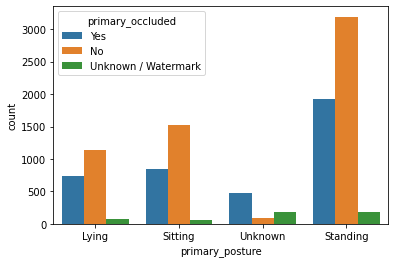

In [ ]:
sns.countplot("primary_posture", hue = "primary_occluded", data = train)

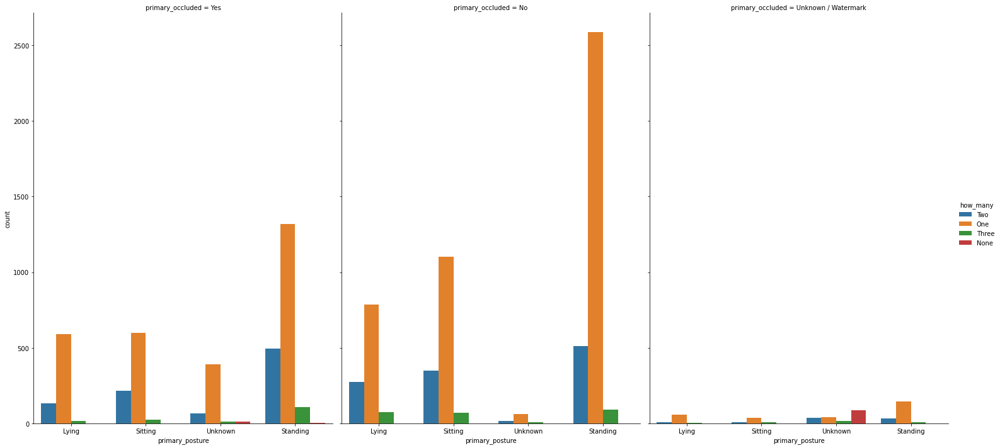

In [ ]:
sns.catplot(x="primary_posture", hue="how_many", col="primary_occluded",
                data=train, kind="count",
                height=10, aspect=0.7)

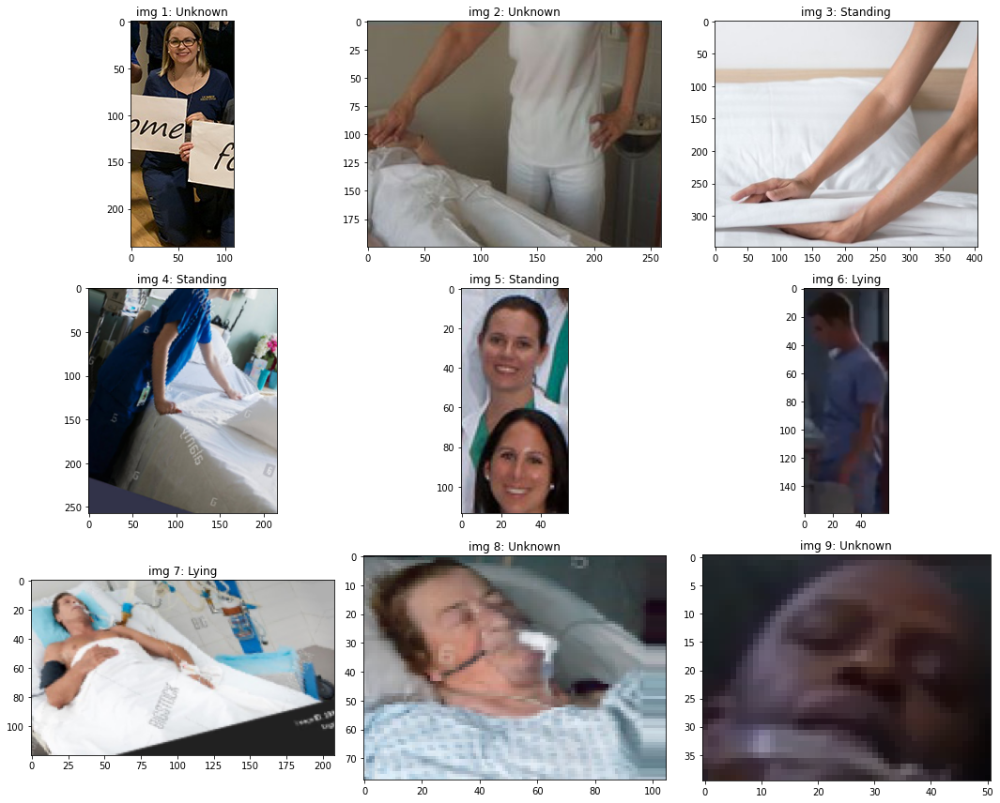

In [ ]:
def show_some_from_df(df):
  plt.figure(1, figsize=(15,12))

  for idx, row in enumerate(df.index,1):
    if idx == 10: break;
    plt.subplot(3,3,idx)
    plt.imshow(openImg(row))
    plt.title(f'img {idx}: {df.iloc[idx].primary_posture}')
  plt.tight_layout()

show_some_from_df(
    train.query("primary_occluded == 'Unknown / Watermark'")
)

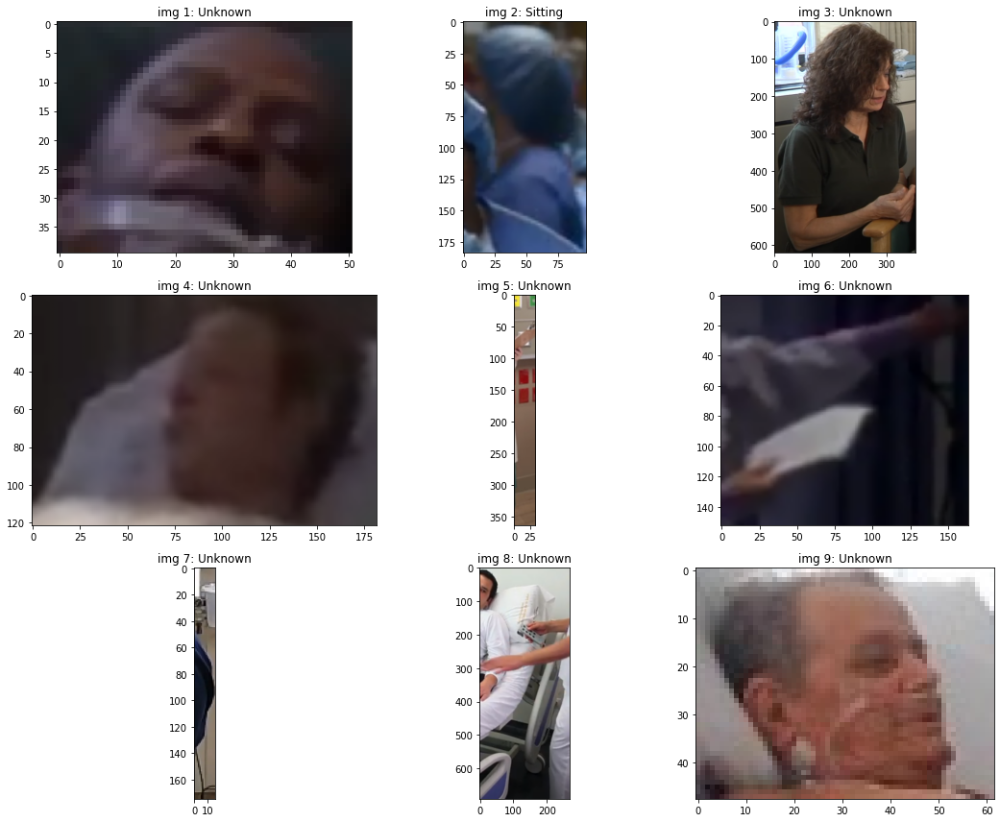

In [ ]:
show_some_from_df(
    train.query("how_many == 'None'")
)

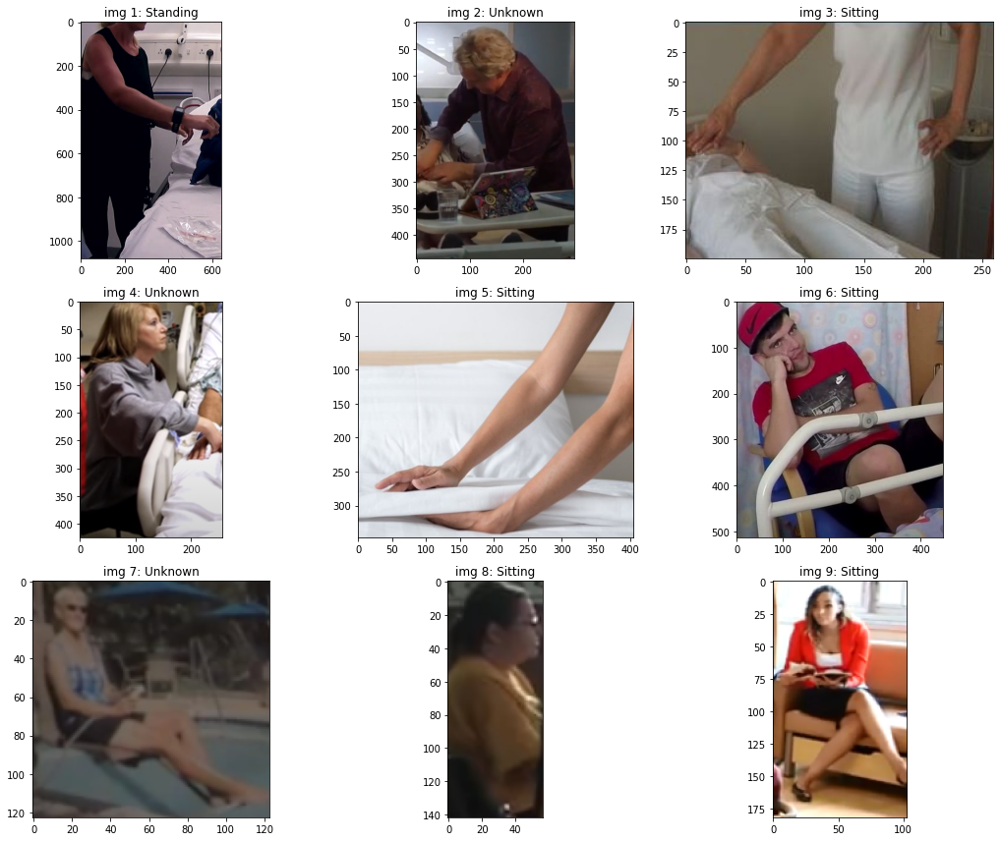

In [ ]:
show_some_from_df(
    train.query("staff_patient_other == 'Other'")
)

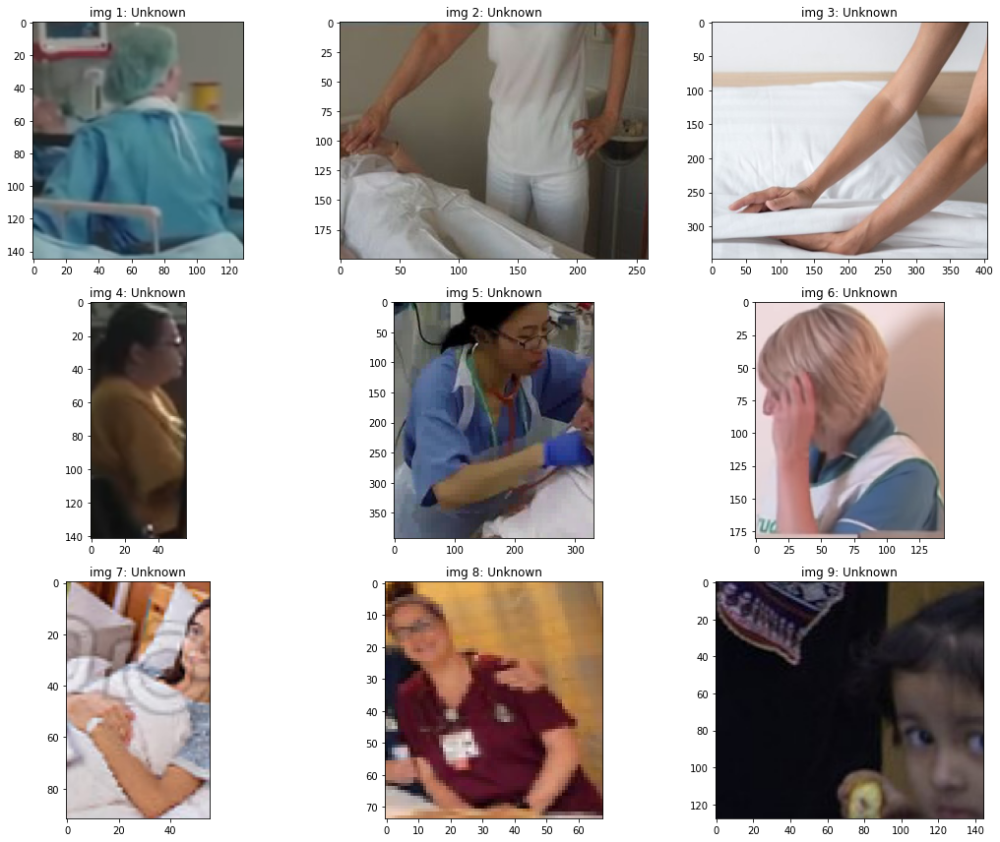

In [ ]:
show_some_from_df(
    train.query("primary_posture == 'Unknown'")
)

In [ ]:
# discard unknown
# we can train the model first and then predict unknown
train = train.query("primary_posture != 'Unknown'")

In [ ]:
train["primary_posture"] .value_counts() / len(train)

Standing    0.548334
Sitting     0.250052
Lying       0.201615
Name: primary_posture, dtype: float64

In [ ]:
test = test.query("primary_posture != 'Unknown'")

In [ ]:
test["primary_posture"] .value_counts()  / len(test)

Standing    0.548908
Sitting     0.247271
Lying       0.203820
Name: primary_posture, dtype: float64

# MobileNet

In [ ]:
!nvidia-smi

Fri Sep  4 16:11:45 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    def eraser(input_img):
        if input_img.ndim == 3:
            img_h, img_w, img_c = input_img.shape
        elif input_img.ndim == 2:
            img_h, img_w = input_img.shape

        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        if pixel_level:
            if input_img.ndim == 3:
                c = np.random.uniform(v_l, v_h, (h, w, img_c))
            if input_img.ndim == 2:
                c = np.random.uniform(v_l, v_h, (h, w))
        else:
            c = np.random.uniform(v_l, v_h)

        input_img[top:top + h, left:left + w] = c

        return input_img

    return eraser

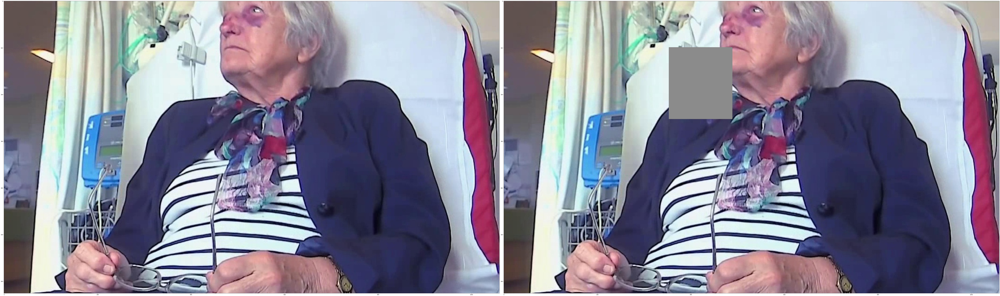

In [ ]:
def cropExample(idx):
  plt.figure(figsize = (120,100))
  img = openImg(idx).copy()
  plt.subplot(1,2,1)
  plt.imshow(img.astype(np.uint8))

  plt.subplot(1,2,2)
  eraser = get_random_eraser()
  img = eraser(img)
  plt.imshow(img.astype(np.uint8))
  
  plt.tight_layout()

cropExample(0)

In [ ]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state=42)
X_resampled, y_resampled = sm.fit_resample(flatten_batch, label_batch)

/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function safe_indexing is deprecated; safe_indexing is deprecated in version 0.22 and will be removed in version 0.24.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
y_resampled

array([0., 1., 1., 2., 0., 0., 1., 0., 2., 2., 2., 1., 1., 1., 1., 1., 0.,
       2., 2., 1., 2., 1., 2., 2., 1., 2., 1., 2., 2., 2., 0., 0., 0., 0.,
       0., 0., 0., 0., 1.], dtype=float32)

In [ ]:
np.unique(y_resampled, return_counts = True)

(array([0., 1., 2.], dtype=float32), array([13, 13, 13]))

In [ ]:
np.unique(label_batch, return_counts = True)

(array([0., 1., 2.], dtype=float32), array([ 7, 12, 13]))

In [ ]:
label_batch

array([0., 1., 1., 2., 0., 0., 1., 0., 2., 2., 2., 1., 1., 1., 1., 1., 0.,
       2., 2., 1., 2., 1., 2., 2., 1., 2., 1., 2., 2., 2., 0., 0.],
      dtype=float32)

In [ ]:
newimg = X_resampled[-1].reshape((224,224,3))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<Figure size 720x720 with 0 Axes>

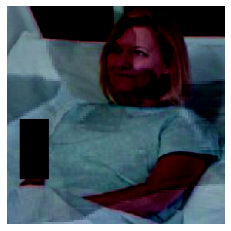

<Figure size 720x720 with 0 Axes>

In [ ]:
plt.imshow(newimg)
plt.axis(False)
plt.figure(figsize=(10,10))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


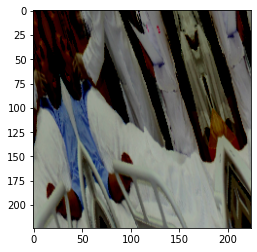

In [ ]:
plt.imshow(X_resampled[31].reshape((224,224,3)))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


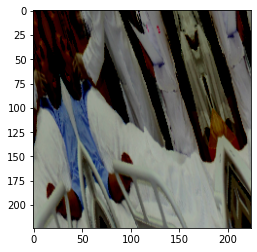

In [ ]:
plt.imshow(image_batch[31])

In [ ]:
flatten_batch = image_batch.reshape(32, -1)
flatten_batch.shape

(32, 150528)

In [ ]:
label_batch

array([0., 1., 1., 2., 0., 0., 1., 0., 2., 2., 2., 1., 1., 1., 1., 1., 0.,
       2., 2., 1., 2., 1., 2., 2., 1., 2., 1., 2., 2., 2., 0., 0.],
      dtype=float32)

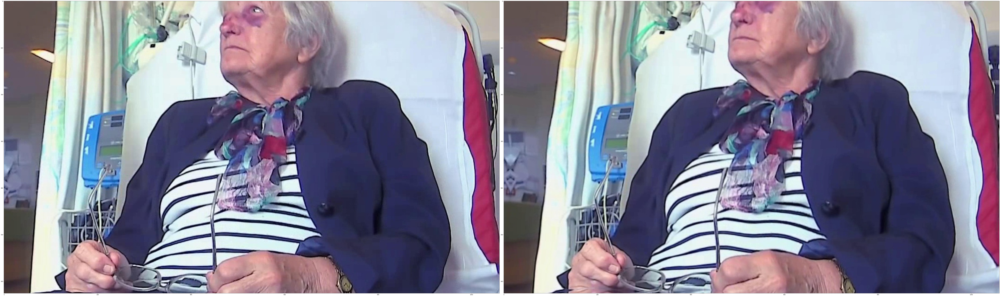

In [ ]:
img = openImg(0)
plt.figure(figsize = (120,100))
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
# plt.imshow(A.GridDistortion()(image = img)['image'])
plt.imshow(A.ElasticTransform(
                  alpha=img.shape[0],
                  sigma=img.shape[0] * 0.05,
                  alpha_affine=img.shape[0] * 0.03)(image = img)['image'])

plt.tight_layout()

In [ ]:
from tensorflow.keras.applications import MobileNetV2, mobilenet_v2

custom_preprocess = lambda img: mobilenet_v2.preprocess_input(get_random_eraser()(img))

AUGMENTATIONS = A.Compose([
            A.Rotate(limit=40),
            A.OneOf([
                     A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
                     A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
            ]),
            A.OneOf([
                     A.ElasticTransform(alpha=224, sigma=224 * 0.05, alpha_affine=224 * 0.03),
                     A.GridDistortion(),
                     A.OpticalDistortion(distort_limit=2, shift_limit=0.5),
            ], p=0.3),
            A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
            A.RandomContrast(limit=0.2, p=0.5),
            A.HorizontalFlip(),
            A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=10),
    ])

train_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                            augment = AUGMENTATIONS,
                            preprocess_input = custom_preprocess,
                            validation_split=0.2,
)

val_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                             preprocess_input= mobilenet_v2.preprocess_input
)

test_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             preprocess_input= mobilenet_v2.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)


test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

Found 7730 validated image filenames belonging to 3 classes.
Found 1932 validated image filenames belonging to 3 classes.
Found 4764 validated image filenames belonging to 3 classes.


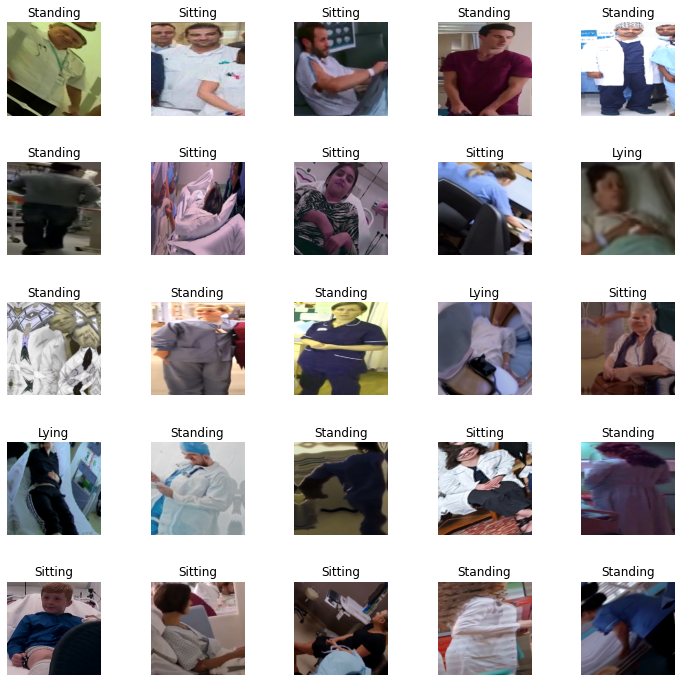

In [ ]:
train_gen.show_batch()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

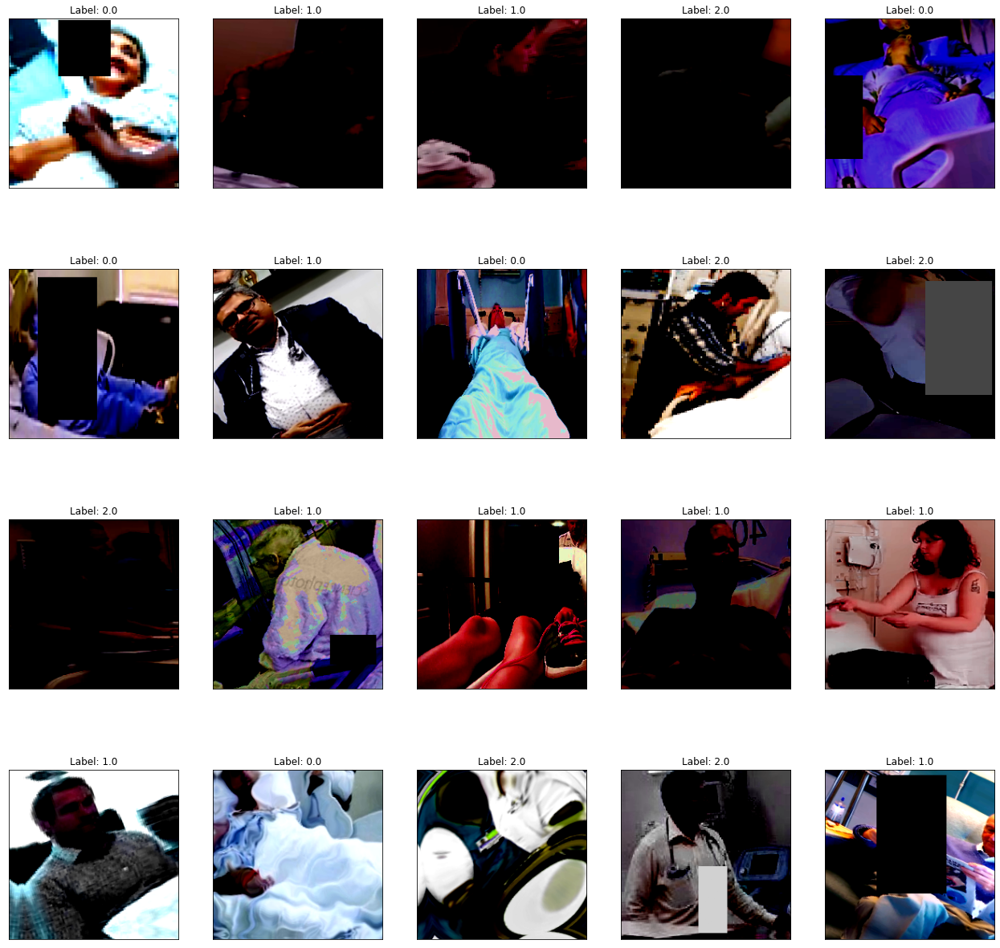

In [ ]:
def view_image(gen):
    image, label = next(iter(gen)) # extract 1 batch from the dataset

    fig = plt.figure(figsize=(22, 22))
    for i in range(20):
        ax = fig.add_subplot(4, 5, i+1, xticks=[], yticks=[])
        ax.imshow(image[i])
        ax.set_title(f"Label: {label[i]}")
view_image(train_gen)

In [ ]:
from tensorflow.keras.layers import (GlobalAveragePooling2D, 
  Dropout, Dense, BatchNormalization)
from tensorflow.keras import optimizers, losses
from tensorflow.keras.applications import MobileNetV2, mobilenet_v2


base_model=MobileNetV2(weights='imagenet',include_top=False,
                       input_shape = (224, 224, 3))
base_model.trainable = True
inputs = tf.keras.Input(shape=(224, 224, 3), name = "image_input")
x = base_model(inputs, training=True, )
# x=keras.base_model.output
x=GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x=Dense(1024,activation='relu')(x)
x=Dense(1024,activation='relu')(x)
x=Dense(512,activation='relu')(x)
x=Dense(128,activation='relu')(x)
preds=Dense(3,activation='softmax')(x)
 
model= tf.keras.Model(inputs=inputs,outputs=[preds], name = "our model")
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
for l in model.layers:
  if l.name.startswith("mobile"):
    l._name = "mobilenetv2"
  # if l.name.startswith("global_average"):
    # l._name = "gloabl_average"

In [ ]:
model.summary()

Model: "our model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
image_input (InputLayer)     [(None, 224, 224, 3)]     0         
_________________________________________________________________
mobilenetv2 (Functional)     (None, 7, 7, 1280)        2257984   
_________________________________________________________________
global_average_pooling2d_5 ( (None, 1280)              0         
_________________________________________________________________
batch_normalization_5 (Batch (None, 1280)              5120      
_________________________________________________________________
dropout_5 (Dropout)          (None, 1280)              0         
_________________________________________________________________
dense_25 (Dense)             (None, 1024)              1311744   
_________________________________________________________________
dense_26 (Dense)             (None, 1024)              10

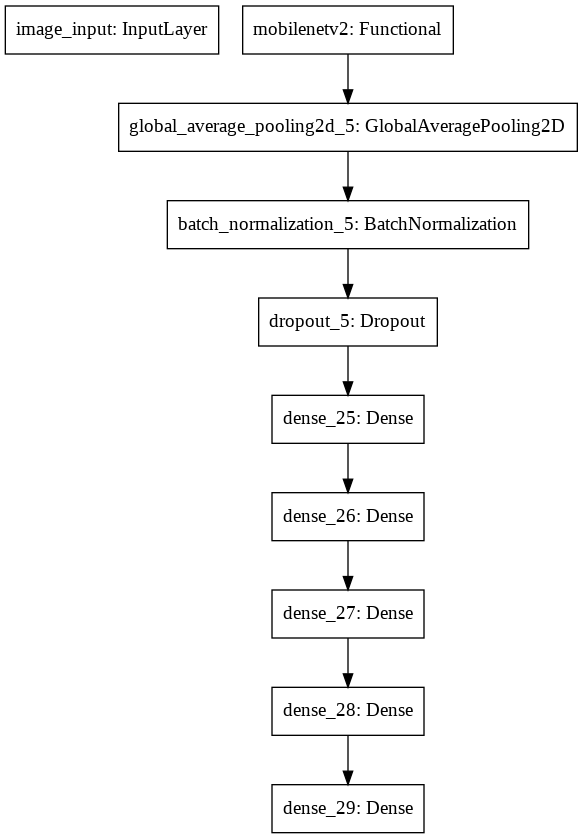

In [ ]:
tf.keras.utils.plot_model(model)

In [ ]:
from sklearn.utils import class_weight
y_train = train["primary_posture"].map(train_gen.class_indices).values
class_weights = dict(zip(np.unique(y_train), class_weight.compute_class_weight('balanced',
                                                 np.unique(y_train),
                                                 y_train)))

In [ ]:
def train_model(model):
  from datetime import datetime
 
  
  save_dir = "/content/drive/My Drive/mobile3rd"
 
  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)
 
  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 10,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  his = model.fit(train_gen, 
      steps_per_epoch=242,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_accuracy:.2f}.h5'),
                 early_stopper, reduce_lr],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 61,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()
 
  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour) + ".h5"
 
  model.save(save_dir)
train_model(model)

Epoch 1/60
242/242 [==============================] - ETA: 0s - loss: 0.7491 - accuracy: 0.6796 

In [ ]:
model.load_weights("/content/drive/My Drive/mobile3rd.19-0.89.h5")

In [ ]:
model.evaluate(test_gen)

149/149 [==============================] - 1690s 11s/step - loss: 0.3201 - accuracy: 0.8843


[0.3201337158679962, 0.8843408823013306]

In [ ]:
def predict_acc(model, test_gen):
  from sklearn.metrics import accuracy_score
  y_pred = model.predict(test_gen, verbose = 1)
  pred_cls = np.argmax(y_pred, axis=1)
 
  true_cls = test["primary_posture"].map(test_gen.class_indices).values
 
  return accuracy_score(pred_cls, true_cls), y_pred
 
acc, y_pred = predict_acc(model, test_gen)

149/149 [==============================] - 37s 251ms/step


In [ ]:
y_pred.shape

(4764, 3)

In [ ]:
y_pred

array([[1.1145730e-02, 4.4441916e-02, 9.4441241e-01],
       [2.9752510e-02, 4.6238562e-01, 5.0786185e-01],
       [1.0517520e-03, 9.6359262e-03, 9.8931235e-01],
       ...,
       [4.2616222e-07, 5.2234107e-05, 9.9994731e-01],
       [8.9315875e-03, 8.1736110e-02, 9.0933233e-01],
       [1.9103118e-06, 4.8300302e-05, 9.9994981e-01]], dtype=float32)

In [ ]:
np.unique(np.argmax(y_pred, axis=1), return_counts=True)

(array([0, 1, 2]), array([ 965, 1075, 2724]))

In [ ]:
pred_cls = np.argmax(y_pred, axis=1)

In [ ]:
pred_cls

array([2, 2, 2, ..., 2, 2, 2])

In [ ]:
true_cls = test["primary_posture"].map(test_gen.class_indices).values

In [ ]:
true_cls

array([2, 2, 2, ..., 2, 2, 0])

In [ ]:
np.sum(pred_cls == true_cls) / len(pred_cls)

0.3994542401343409

In [ ]:
np.sum(pred_cls == true_cls) 

1903

In [ ]:
len(true_cls)

4764

In [ ]:
test_gen.reset()


In [ ]:
y_pred = model.predict_generator(test_gen, verbose = 1)

Instructions for updating:
Please use Model.predict, which supports generators.
149/149 [==============================] - 38s 258ms/step


In [ ]:
pred_cls = np.argmax(y_pred, axis=1)

In [ ]:
from sklearn.metrics import accuracy_score

In [ ]:
accuracy_score(pred_cls, true_cls)

0.4103694374475231

In [ ]:
test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=False,
                            target_size=(224, 224),
                            validate_filenames = True,
)

Found 4764 validated image filenames belonging to 3 classes.


In [ ]:
test_gen.reset()

In [ ]:
y_pred = model.predict(test_gen, verbose = 1)

149/149 [==============================] - 39s 260ms/step


In [ ]:
pred_cls = np.argmax(y_pred, axis=1)

In [ ]:
accuracy_score(pred_cls, true_cls)

0.8843408900083963

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_true=test_gen.classes, y_pred=pred_cls, target_names=test_gen.class_indices))

              precision    recall  f1-score   support

       Lying       0.85      0.85      0.85       971
     Sitting       0.81      0.74      0.77      1178
    Standing       0.93      0.96      0.95      2615

    accuracy                           0.88      4764
   macro avg       0.86      0.85      0.86      4764
weighted avg       0.88      0.88      0.88      4764



In [ ]:
cm

array([[ 824,  133,   14],
       [ 125,  866,  187],
       [  16,   76, 2523]])

In [ ]:
df.index = df.index.map(lambda x: "true: " + str(x))

In [ ]:
df

,Lying,Sitting,Standing
true: 0,824,133,14
true: 1,125,866,187
true: 2,16,76,2523


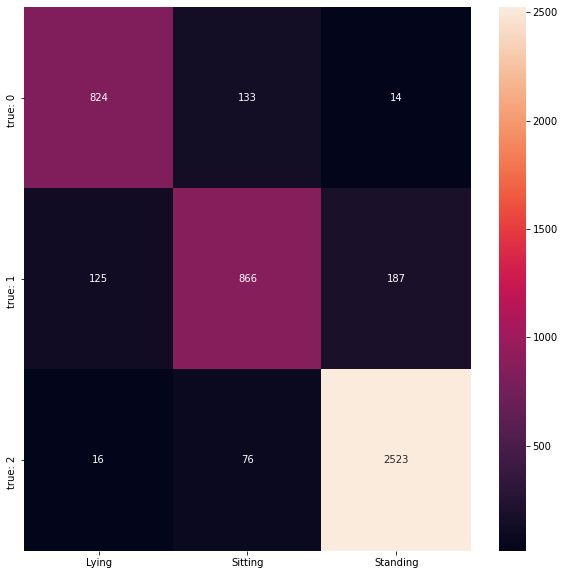

In [ ]:
plt.figure(figsize=(10, 10))
sns.heatmap(df, annot=True, fmt='d')

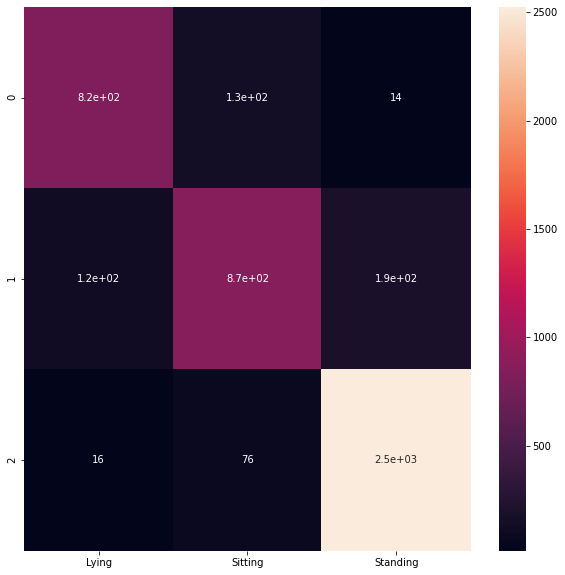

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_gen.classes, pred_cls)
df = pd.DataFrame(cm, columns=test_gen.class_indices)
plt.figure(figsize=(10, 10))
sns.heatmap(df, annot=True)

## Already run

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, mobilenet_v2

custom_preprocess = lambda img: mobilenet_v2.preprocess_input(get_random_eraser()(img))


train_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                            shear_range=0.1,
                            zoom_range=0.1,
                            width_shift_range=0.1,
                            height_shift_range=0.1,
                            brightness_range=[0.9,1.1],
                            horizontal_flip=True,
                            validation_split=0.2,
                            preprocessing_function=custom_preprocess
)

val_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                             preprocessing_function= mobilenet_v2.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

test_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                             preprocessing_function= mobilenet_v2.preprocess_input
)

test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

Found 7730 validated image filenames belonging to 3 classes.
Found 1932 validated image filenames belonging to 3 classes.
Found 4764 validated image filenames belonging to 3 classes.


Epoch 1/60
242/242 [==============================] - 164s 679ms/step - loss: 0.7732 - accuracy: 0.6759 - val_loss: 1.0677 - val_accuracy: 0.6744
Epoch 2/60
242/242 [==============================] - 156s 645ms/step - loss: 0.6665 - accuracy: 0.7464 - val_loss: 2.4582 - val_accuracy: 0.6408
Epoch 3/60
242/242 [==============================] - 153s 631ms/step - loss: 0.5941 - accuracy: 0.7721 - val_loss: 1.5860 - val_accuracy: 0.6299
Epoch 4/60
242/242 [==============================] - ETA: 0s - loss: 0.5539 - accuracy: 0.7918
Epoch 00004: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
242/242 [==============================] - 153s 631ms/step - loss: 0.5539 - accuracy: 0.7918 - val_loss: 2.3472 - val_accuracy: 0.6413
Epoch 5/60
242/242 [==============================] - 153s 634ms/step - loss: 0.4433 - accuracy: 0.8352 - val_loss: 1.6385 - val_accuracy: 0.6449
Epoch 6/60
242/242 [==============================] - 153s 632ms/step - loss: 0.3893 - accuracy: 0.8552 -

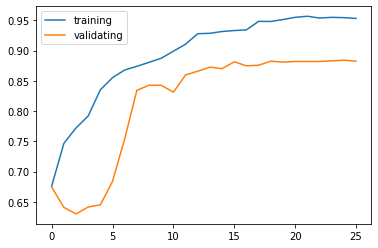

In [ ]:
def train_model(model):
  from datetime import datetime
 
  
  save_dir = "/content/drive/My Drive/mobile 2nd"
 
  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)
 
  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 10,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  his = model.fit(train_gen, 
      steps_per_epoch=242,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_loss:.2f}.h5'),
                 early_stopper, reduce_lr],
      verbose = 1,
      class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 61,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()
 
  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour) + ".h5"
 
  model.save(save_dir)
train_model(model)

Epoch 1/60
242/242 [==============================] - 154s 638ms/step - loss: 0.6814 - accuracy: 0.7103 - val_loss: 1.3697 - val_accuracy: 0.6506
Epoch 2/60
242/242 [==============================] - 152s 629ms/step - loss: 0.5679 - accuracy: 0.7653 - val_loss: 1.0791 - val_accuracy: 0.7195
Epoch 3/60
242/242 [==============================] - 156s 643ms/step - loss: 0.5129 - accuracy: 0.7906 - val_loss: 1.0079 - val_accuracy: 0.6382
Epoch 4/60
242/242 [==============================] - 160s 660ms/step - loss: 0.4803 - accuracy: 0.8076 - val_loss: 1.5649 - val_accuracy: 0.6589
Epoch 5/60
242/242 [==============================] - ETA: 0s - loss: 0.4490 - accuracy: 0.8188
Epoch 00005: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
242/242 [==============================] - 156s 643ms/step - loss: 0.4490 - accuracy: 0.8188 - val_loss: 1.2463 - val_accuracy: 0.6273
Epoch 6/60
242/242 [==============================] - 156s 646ms/step - loss: 0.3543 - accuracy: 0.8585 -

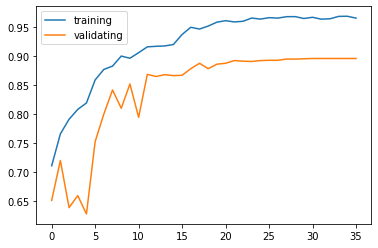

In [ ]:
# without class_weight
def train_model(model):
  from datetime import datetime

  
  save_dir = "/content/drive/My Drive/mobile"

  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)

  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 10,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  his = model.fit(train_gen, 
      steps_per_epoch=242,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_loss:.2f}.h5'),
                 early_stopper, reduce_lr],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 61,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()

  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour) + ".h5"

  model.save(save_dir)
train_model(model)

In [ ]:
model.evaluate(val_gen)

61/61 [==============================] - 13s 207ms/step - loss: 0.3715 - accuracy: 0.8923


[0.371486097574234, 0.8923395276069641]

In [ ]:
model.evaluate(test_gen)

149/149 [==============================] - 30s 204ms/step - loss: 0.3931 - accuracy: 0.8866


[0.3931344449520111, 0.8866498470306396]

In [ ]:
def predict_acc(model, test_gen):
  from sklearn.metrics import accuracy_score
  y_pred = model.predict(test_gen, verbose = 1)
  pred_cls = np.argmax(y_pred, axis=1)
 
  true_cls = test["primary_posture"].map(test_gen.class_indices).values
 
  return accuracy_score(pred_cls, true_cls)
 
predict_acc(model, test_gen)

149/149 [==============================] - 30s 201ms/step


0.40218303946263645

In [ ]:
model.load_weights("/content/drive/My Drive/mobile.36-0.38.h5")

In [ ]:
model.evaluate(test_gen)

149/149 [==============================] - 2716s 18s/step - loss: 0.4034 - accuracy: 0.8896


[0.40343591570854187, 0.8895885944366455]

In [ ]:
def predict_acc(model, test_gen):
  from sklearn.metrics import accuracy_score
  y_pred = model.predict(test_gen, verbose = 1)
  pred_cls = np.argmax(y_pred, axis=1)
 
  true_cls = test["primary_posture"].map(test_gen.class_indices).values
 
  return accuracy_score(pred_cls, true_cls), y_pred
 
acc, y_pred = predict_acc(model, test_gen)

149/149 [==============================] - 37s 248ms/step


0.390848026868178

In [ ]:
model.predict(test_gen, verbose = 1)

149/149 [==============================] - 31s 211ms/step


array([[9.3588543e-01, 6.1719976e-02, 2.3944923e-03],
       [8.4525016e-07, 8.3155086e-05, 9.9991596e-01],
       [5.0164618e-07, 1.0969873e-04, 9.9988973e-01],
       ...,
       [2.7949642e-04, 4.4853198e-03, 9.9523515e-01],
       [3.9362852e-02, 9.5942062e-01, 1.2165031e-03],
       [1.7900647e-05, 1.2316178e-03, 9.9875045e-01]], dtype=float32)

In [ ]:
y_pred = Out[54];
y_pred.shape

(4764, 3)

In [ ]:
pred_cls = np.argmax(y_pred, axis=1)
true_cls = test["primary_posture"]

In [ ]:
true_cls = true_cls.map(test_gen.class_indices).values

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(pred_cls, true_cls)

0.3984047019311503

In [ ]:
test_gen.class_indices

{'Lying': 0, 'Sitting': 1, 'Standing': 2}

In [ ]:
from tensorflow.keras.layers import (GlobalAveragePooling2D, 
  Dropout, Dense, BatchNormalization)
from tensorflow.keras import optimizers, losses
 
 
base_model=MobileNetV2(weights='imagenet',include_top=False,
                       input_shape = (224, 224, 3))
base_model.trainable = True
x=base_model.output
x=GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x=Dense(512,activation='relu')(x)
x=Dense(256,activation='relu')(x)
x=Dense(128,activation='relu')(x)
preds=Dense(3,activation='softmax')(x)
 
model= tf.keras.Model(inputs=[base_model.input],outputs=[preds])
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

9412608/9406464 [==============================] - 0s 0us/step


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import MobileNetV2, mobilenet_v2

custom_preprocess = lambda img: mobilenet_v2.preprocess_input(
    elastic_transform(
        get_random_eraser()(img),
        img.shape[1] * 2, img.shape[1] * 0.08, img.shape[1] * 0.08
        )
)


train_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                            shear_range=0.1,
                            zoom_range=0.1,
                            width_shift_range=0.1,
                            height_shift_range=0.1,
                            brightness_range=[0.9,1.1],
                            horizontal_flip=True,
                            validation_split=0.2,
                            preprocessing_function=custom_preprocess
)

val_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                             preprocessing_function= mobilenet_v2.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)


test_datagen = ImageDataGenerator(data_format="channels_last",
                            #  rescale = 1./255,
                             preprocessing_function= mobilenet_v2.preprocess_input
)

test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

Found 7730 validated image filenames belonging to 3 classes.
Found 1932 validated image filenames belonging to 3 classes.
Found 4764 validated image filenames belonging to 3 classes.


In [ ]:
# less dense layer more dropout
# doesn't work
def train_model(model):
  from datetime import datetime

  
  save_dir = "/content/drive/My Drive/mobile3rd"

  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)

  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 10,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  his = model.fit(train_gen, 
      steps_per_epoch=242,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_loss:.2f}.h5'),
                 early_stopper, reduce_lr],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 61,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()

  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour) + ".h5"

  model.save(save_dir)
train_model(model)

Epoch 1/60
242/242 [==============================] - 5554s 23s/step - loss: 0.7123 - accuracy: 0.6937 - val_loss: 1.8529 - val_accuracy: 0.6175
Epoch 2/60
242/242 [==============================] - 942s 4s/step - loss: 0.5775 - accuracy: 0.7583 - val_loss: 1.9511 - val_accuracy: 0.6454
Epoch 3/60
242/242 [==============================] - 940s 4s/step - loss: 0.5196 - accuracy: 0.7887 - val_loss: 1.9186 - val_accuracy: 0.6511
Epoch 4/60
242/242 [==============================] - 943s 4s/step - loss: 0.4883 - accuracy: 0.8032 - val_loss: 0.6792 - val_accuracy: 0.7676
Epoch 5/60
242/242 [==============================] - 936s 4s/step - loss: 0.4722 - accuracy: 0.8041 - val_loss: 0.9099 - val_accuracy: 0.7666
Epoch 6/60
242/242 [==============================] - 941s 4s/step - loss: 0.4646 - accuracy: 0.8057 - val_loss: 1.6865 - val_accuracy: 0.6092
Epoch 7/60
242/242 [==============================] - ETA: 0s - loss: 0.4429 - accuracy: 0.8168
Epoch 00007: ReduceLROnPlateau reducing lear

KeyboardInterrupt: ignored

## freeze

In [ ]:
from tensorflow.keras.layers import (GlobalAveragePooling2D, 
  Dropout, Dense, BatchNormalization)
from tensorflow.keras import optimizers, losses


base_model=MobileNetV2(weights='imagenet',include_top=False,
                       input_shape = (224, 224, 3))
base_model.trainable = False
x=base_model.output
x=GlobalAveragePooling2D()(x)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x=Dense(1024,activation='relu')(x)
x=Dense(1024,activation='relu')(x)
x=Dense(512,activation='relu')(x)
x=Dense(128,activation='relu')(x)
preds=Dense(3,activation='softmax')(x)

model= tf.keras.Model(inputs=base_model.input,outputs=preds)
model.summary()

9412608/9406464 [==============================] - 0s 0us/step
Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, 225, 225, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, 112, 112, 32) 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, 112, 112, 32) 128         Conv1[0][0]                      
________________________

In [ ]:
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

In [ ]:
his = model.fit(train_gen, 
      steps_per_epoch=240,
      epochs=30,
      verbose = 1,
      validation_data = val_gen,
      validation_steps = 10,
      shuffle = True,
)

Epoch 1/30
240/240 [==============================] - 148s 617ms/step - loss: 0.6626 - accuracy: 0.7224 - val_loss: 0.5174 - val_accuracy: 0.7719
Epoch 2/30
240/240 [==============================] - 219s 913ms/step - loss: 0.5539 - accuracy: 0.7643 - val_loss: 0.4826 - val_accuracy: 0.8219
Epoch 3/30
240/240 [==============================] - 255s 1s/step - loss: 0.5304 - accuracy: 0.7819 - val_loss: 0.4413 - val_accuracy: 0.8219
Epoch 4/30
240/240 [==============================] - 226s 940ms/step - loss: 0.5087 - accuracy: 0.7852 - val_loss: 0.4955 - val_accuracy: 0.8062
Epoch 5/30
240/240 [==============================] - 215s 896ms/step - loss: 0.5114 - accuracy: 0.7831 - val_loss: 0.4746 - val_accuracy: 0.7812
Epoch 6/30
240/240 [==============================] - 210s 876ms/step - loss: 0.4788 - accuracy: 0.7987 - val_loss: 0.3844 - val_accuracy: 0.8344
Epoch 7/30
240/240 [==============================] - 202s 841ms/step - loss: 0.4765 - accuracy: 0.7996 - val_loss: 0.4399 - va

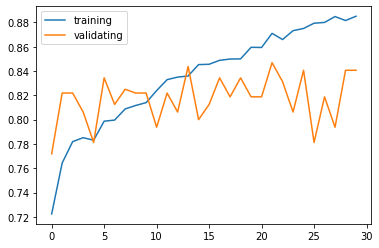

In [ ]:
plt.plot(his.history["accuracy"], label = "training")
plt.plot(his.history["val_accuracy"], label = "validating")
plt.legend()

In [ ]:
model.save("/content/drive/My Drive/mobile.h5")

In [ ]:
his = model.fit(train_gen, 
      steps_per_epoch=240,
      epochs=50,
      verbose = 1,
      validation_data = val_gen,
      validation_steps = 10,
      shuffle = True,
)

Epoch 1/50
240/240 [==============================] - 4527s 19s/step - loss: 0.6550 - accuracy: 0.7189 - val_loss: 0.5464 - val_accuracy: 0.7812
Epoch 2/50
240/240 [==============================] - 294s 1s/step - loss: 0.5737 - accuracy: 0.7558 - val_loss: 0.5422 - val_accuracy: 0.7969
Epoch 3/50
240/240 [==============================] - 255s 1s/step - loss: 0.5559 - accuracy: 0.7706 - val_loss: 0.4703 - val_accuracy: 0.8125
Epoch 4/50
240/240 [==============================] - 227s 945ms/step - loss: 0.5331 - accuracy: 0.7696 - val_loss: 0.4475 - val_accuracy: 0.8188
Epoch 5/50
240/240 [==============================] - 212s 883ms/step - loss: 0.5097 - accuracy: 0.7870 - val_loss: 0.5061 - val_accuracy: 0.8094
Epoch 6/50
240/240 [==============================] - 196s 817ms/step - loss: 0.5065 - accuracy: 0.7886 - val_loss: 0.4272 - val_accuracy: 0.8250
Epoch 7/50
240/240 [==============================] - 187s 780ms/step - loss: 0.4877 - accuracy: 0.7948 - val_loss: 0.4439 - val_ac

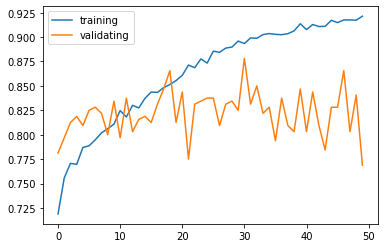

In [ ]:
plt.plot(his.history["accuracy"], label = "training")
plt.plot(his.history["val_accuracy"], label = "validating")
plt.legend()

In [ ]:
model.save("/content/drive/My Drive/mobile2.h5")

# EfficientNet

In [ ]:
def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    def eraser(input_img):
        if input_img.ndim == 3:
            img_h, img_w, img_c = input_img.shape
        elif input_img.ndim == 2:
            img_h, img_w = input_img.shape

        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        if pixel_level:
            if input_img.ndim == 3:
                c = np.random.uniform(v_l, v_h, (h, w, img_c))
            if input_img.ndim == 2:
                c = np.random.uniform(v_l, v_h, (h, w))
        else:
            c = np.random.uniform(v_l, v_h)

        input_img[top:top + h, left:left + w] = c

        return input_img

    return eraser

In [ ]:
from tensorflow.keras.applications import EfficientNetB0, efficientnet

custom_preprocess = lambda img: efficientnet.preprocess_input(get_random_eraser()(img))

AUGMENTATIONS = A.Compose([
            A.Rotate(limit=40),
            A.OneOf([
                     A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
                     A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
            ]),
            A.OneOf([
                     A.ElasticTransform(alpha=224, sigma=224 * 0.05, alpha_affine=224 * 0.03),
                     A.GridDistortion(),
                     A.OpticalDistortion(distort_limit=2, shift_limit=0.5),
            ], p=0.3),
            A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
            A.RandomContrast(limit=0.2, p=0.5),
            A.HorizontalFlip(),
            A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=10),
    ])

train_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                            augment = AUGMENTATIONS,
                            preprocess_input = custom_preprocess,
                            validation_split=0.2,
)

val_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                             preprocess_input= efficientnet.preprocess_input
)

test_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             preprocess_input= efficientnet.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)


test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            validate_filenames = True,
)

Found 7730 validated image filenames belonging to 3 classes.
Found 1932 validated image filenames belonging to 3 classes.
Found 4764 validated image filenames belonging to 3 classes.


In [ ]:
from tensorflow.keras.layers import (GlobalAveragePooling2D, 
  Dropout, Dense, BatchNormalization)
from tensorflow.keras import optimizers, losses

from tensorflow.keras.applications import EfficientNetB0

def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

inputs = tf.keras.Input(shape=(224, 224, 3), name = "image_input")
conv_base = EfficientNetB0(input_shape=(224, 224,3), input_tensor= inputs, drop_connect_rate=0.4,
                       include_top = False)

conv_base.trainable = False

unfreeze_model(conv_base)
# x = conv_base(inputs, training=False, )
# x = conv_base
x=GlobalAveragePooling2D()(conv_base.output)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x=Dense(512,activation='relu')(x)
x=Dense(256,activation='relu')(x)
x=Dense(128,activation='relu')(x)
preds=Dense(3,activation='softmax')(x)
 
model= tf.keras.Model(inputs=inputs,outputs=[preds], name = "our_model")
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

Epoch 1/60
242/242 [==============================] - 110s 456ms/step - loss: 0.6938 - accuracy: 0.7057 - val_loss: 0.4531 - val_accuracy: 0.8163
Epoch 2/60
242/242 [==============================] - 108s 445ms/step - loss: 0.5725 - accuracy: 0.7586 - val_loss: 0.4460 - val_accuracy: 0.8271
Epoch 3/60
242/242 [==============================] - 108s 448ms/step - loss: 0.5482 - accuracy: 0.7799 - val_loss: 0.3922 - val_accuracy: 0.8478
Epoch 4/60
242/242 [==============================] - 109s 449ms/step - loss: 0.5069 - accuracy: 0.7908 - val_loss: 0.3720 - val_accuracy: 0.8556
Epoch 5/60
242/242 [==============================] - 108s 448ms/step - loss: 0.5002 - accuracy: 0.7935 - val_loss: 0.4795 - val_accuracy: 0.8240
Epoch 6/60
242/242 [==============================] - ETA: 0s - loss: 0.4706 - accuracy: 0.8058
Epoch 00006: ReduceLROnPlateau reducing learning rate to 0.0002500000118743628.
242/242 [==============================] - 108s 447ms/step - loss: 0.4706 - accuracy: 0.8058 -

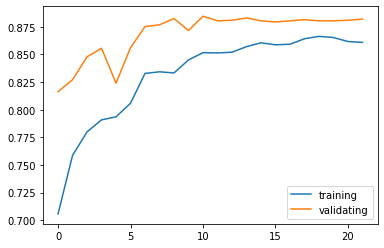

In [ ]:
def train_model(model):
  from datetime import datetime
  import json
  
  save_dir = "/content/drive/My Drive/model/eff2nd"
 
  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)
 
  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 13,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  

  txt_log = open(save_dir+".log", mode='wt', buffering=1)
  
  log_callback = tf.keras.callbacks.LambdaCallback(
    on_epoch_end = lambda epoch, logs: txt_log.write(
      json.dumps({'epoch': epoch, 'loss': logs['loss']}) + '\n'),
    on_train_end = lambda logs: txt_log.close()
  )


  his = model.fit(train_gen, 
      steps_per_epoch=242,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_accuracy:.2f}.h5'),
                 early_stopper, reduce_lr,
                 log_callback,
                 ],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 61,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()
  plt.savefig(save_dir + "plot.jpg")
 
  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour)
 
  model.save(save_dir)
train_model(model)

In [ ]:
test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=False,
                            target_size=(224, 224),
                            validate_filenames = True,
)
test_gen.reset()

Found 4764 validated image filenames belonging to 3 classes.


In [ ]:
y_pred1 = model.predict(test_gen)

In [ ]:
def check_acc(y_pred, gen):
  from sklearn.metrics import accuracy_score
  pred_cls = np.argmax(y_pred,axis = 1)
  true_cls = test_gen.classes
  return accuracy_score(true_cls, pred_cls)

check_acc(y_pred1, test_gen)

0.8845507976490344

In [ ]:
model = tf.keras.models.load_model("/content/drive/My Drive/model/mobile3rd.19-0.89.h5")

In [ ]:
y_pred2 = model.predict(test_gen)

0.8845507976490344

In [ ]:
check_acc(y_pred2, test_gen)

0.6135600335852225

### edge detection

In [ ]:
labels_path = '/content/drive/My Drive/M499/tranch2_labels.csv'
labels = pd.read_csv(labels_path)

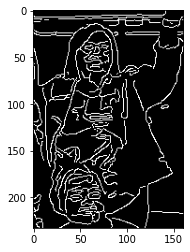

In [ ]:
img = cv2.imread("/content/drive/My Drive/M499/edge/" + labels["final_url"][0])
plt.imshow(img)

In [ ]:
labels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12698 entries, 0 to 12697
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   final_url            12698 non-null  object
 1   how_many             12698 non-null  object
 2   primary_posture      12237 non-null  object
 3   primary_occluded     12133 non-null  object
 4   staff_patient_other  12107 non-null  object
dtypes: object(5)
memory usage: 496.1+ KB


In [ ]:
labels.isnull().sum()

final_url                0
how_many                 0
primary_posture        461
primary_occluded       565
staff_patient_other    591
dtype: int64

In [ ]:
labels = labels.dropna()
labels.index = range(len(labels))

In [ ]:
labels["primary_posture"].value_counts()

Standing    7443
Sitting     3178
Lying        944
Unknown      522
Name: primary_posture, dtype: int64

In [ ]:
labels = labels.query("primary_posture != 'Unknown'")

In [ ]:
labels.final_url = labels.final_url.map(lambda s: ".".join([s.rsplit(".",1)[0], "png"]))

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(labels, test_size=0.15, random_state=42)
len(train), len(test)

(9830, 1735)

In [ ]:
def get_random_eraser(p=0.5, s_l=0.02, s_h=0.4, r_1=0.3, r_2=1/0.3, v_l=0, v_h=255, pixel_level=False):
    def eraser(input_img):
        if input_img.ndim == 3:
            img_h, img_w, img_c = input_img.shape
        elif input_img.ndim == 2:
            img_h, img_w = input_img.shape

        p_1 = np.random.rand()

        if p_1 > p:
            return input_img

        while True:
            s = np.random.uniform(s_l, s_h) * img_h * img_w
            r = np.random.uniform(r_1, r_2)
            w = int(np.sqrt(s / r))
            h = int(np.sqrt(s * r))
            left = np.random.randint(0, img_w)
            top = np.random.randint(0, img_h)

            if left + w <= img_w and top + h <= img_h:
                break

        if pixel_level:
            if input_img.ndim == 3:
                c = np.random.uniform(v_l, v_h, (h, w, img_c))
            if input_img.ndim == 2:
                c = np.random.uniform(v_l, v_h, (h, w))
        else:
            c = np.random.uniform(v_l, v_h)

        input_img[top:top + h, left:left + w] = c

        return input_img

    return eraser

In [ ]:
from tensorflow.keras.applications import EfficientNetB0, efficientnet

train_preprocess = lambda img: efficientnet.preprocess_input(get_random_eraser()(img))

AUGMENTATIONS = A.Compose([
            A.Rotate(limit=40),
            A.OneOf([
                     A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3),
                     A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.1)
            ]),
            A.OneOf([
                     A.ElasticTransform(alpha=224, sigma=224 * 0.05, alpha_affine=224 * 0.03),
                     A.GridDistortion(),
                     A.OpticalDistortion(distort_limit=2, shift_limit=0.5),
            ], p=0.3),
            A.HueSaturationValue(hue_shift_limit=20, sat_shift_limit=30, val_shift_limit=20, p=0.5),
            A.RandomContrast(limit=0.2, p=0.5),
            A.HorizontalFlip(),
            A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=10),
    ])

train_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                            augment = AUGMENTATIONS,
                            preprocess_input = train_preprocess,
                            validation_split=0.2,
)

val_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             validation_split=0.2,
                             preprocess_input= efficientnet.preprocess_input
)

test_datagen = ImageDataAugmentor(data_format="channels_last",
                            #  rescale = 1./255,
                             preprocess_input= efficientnet.preprocess_input
)

train_gen = train_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/edge",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(224, 224),
                            # validate_filenames = True,
)

val_gen = val_datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/edge",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(224, 224),
                            # validate_filenames = True,
)


test_gen = test_datagen.flow_from_dataframe(test,
                            directory = "/content/drive/My Drive/M499/edge",
                            x_col = "final_url",
                            y_col = "primary_posture",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            shuffle=True,
                            target_size=(224, 224),
                            # validate_filenames = True,
)

/usr/local/lib/python3.6/dist-packages/ImageDataAugmentor/dataframe_iterator.py:276: UserWarning: Found 1786 invalid image filename(s) in x_col="final_url". These filename(s) will be ignored.
  .format(n_invalid, x_col)


Found 6436 validated image filenames belonging to 3 classes.
Found 1608 validated image filenames belonging to 3 classes.
Found 1393 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.6/dist-packages/ImageDataAugmentor/dataframe_iterator.py:276: UserWarning: Found 342 invalid image filename(s) in x_col="final_url". These filename(s) will be ignored.
  .format(n_invalid, x_col)


In [ ]:
from tensorflow.keras.layers import (GlobalAveragePooling2D, 
  Dropout, Dense, BatchNormalization)
from tensorflow.keras import optimizers, losses

from tensorflow.keras.applications import EfficientNetB0

def unfreeze_model(model):
    # We unfreeze the top 20 layers while leaving BatchNorm layers frozen
    for layer in model.layers[-20:]:
        if not isinstance(layer, layers.BatchNormalization):
            layer.trainable = True

inputs = tf.keras.Input(shape=(224, 224, 3), name = "image_input")
conv_base = EfficientNetB0(input_shape=(224, 224,3), input_tensor= inputs, drop_connect_rate=0.4,
                       include_top = False)

conv_base.trainable = False

unfreeze_model(conv_base)
# x = conv_base(inputs, training=False, )
# x = conv_base
x=GlobalAveragePooling2D()(conv_base.output)
x = BatchNormalization()(x)
x = Dropout(0.3)(x)
x = Dense(1024, activation = 'relu')(x)
x=Dense(512,activation='relu')(x)
x=Dense(256,activation='relu')(x)
x=Dense(128,activation='relu')(x)
preds=Dense(3,activation='softmax')(x)
 
model= tf.keras.Model(inputs=inputs,outputs=[preds], name = "our_model")
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

Epoch 1/60
202/202 [==============================] - 69s 340ms/step - loss: 0.7485 - accuracy: 0.6580 - val_loss: 0.6058 - val_accuracy: 0.7363
Epoch 2/60
202/202 [==============================] - 68s 337ms/step - loss: 0.6651 - accuracy: 0.7079 - val_loss: 0.5497 - val_accuracy: 0.7556
Epoch 3/60
202/202 [==============================] - 67s 331ms/step - loss: 0.6387 - accuracy: 0.7143 - val_loss: 0.4988 - val_accuracy: 0.7867
Epoch 4/60
202/202 [==============================] - 67s 331ms/step - loss: 0.6158 - accuracy: 0.7265 - val_loss: 0.4870 - val_accuracy: 0.7923
Epoch 5/60
202/202 [==============================] - 68s 337ms/step - loss: 0.5978 - accuracy: 0.7415 - val_loss: 0.4956 - val_accuracy: 0.7892
Epoch 6/60
202/202 [==============================] - 68s 338ms/step - loss: 0.5961 - accuracy: 0.7382 - val_loss: 0.4482 - val_accuracy: 0.8072
Epoch 7/60
202/202 [==============================] - 67s 334ms/step - loss: 0.5822 - accuracy: 0.7483 - val_loss: 0.4680 - val_ac

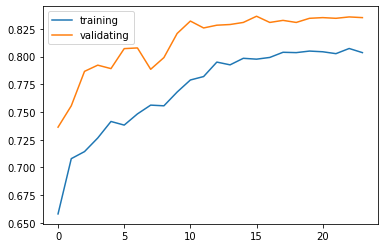

In [ ]:
def train_model(model):
  from datetime import datetime
  import json
  
  save_dir = "/content/drive/My Drive/model/edge"
 
  # Reduce learning rate when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.01,
                                                  patience = 3,
                                                  factor = 0.25,
                                                  verbose = 1,
                                                  cooldown = 0,
                                                  min_lr = 0.00000001)
 
  # Stop the training process when there is a change lesser than <min_delta> in <val_accuracy> for more than <patience> epochs
  early_stopper = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  mode = 'max',
                                                  min_delta = 0.005,
                                                  patience = 13,
                                                  verbose = 1,
                                                  restore_best_weights = True)
  

  txt_log = open(save_dir+".log", mode='wt', buffering=1)
  
  log_callback = tf.keras.callbacks.LambdaCallback(
    on_epoch_end = lambda epoch, logs: txt_log.write(
      json.dumps({'epoch': epoch, 'loss': logs['loss']}) + '\n'),
    on_train_end = lambda logs: txt_log.close()
  )


  his = model.fit(train_gen, 
      steps_per_epoch=202,
      epochs=60,
      callbacks=[
                 tf.keras.callbacks.ModelCheckpoint(filepath=save_dir + '.{epoch:02d}-{val_accuracy:.2f}.h5'),
                 early_stopper, reduce_lr,
                 log_callback,
                 ],
      verbose = 1,
      # class_weight = class_weights,
      validation_data = val_gen,
      validation_steps = 51,
      shuffle = True,
  )
  plt.plot(his.history["accuracy"], label = "training")
  plt.plot(his.history["val_accuracy"], label = "validating")
  plt.legend()
  plt.savefig(save_dir + "plot.jpg")
 
  cur = datetime.now()
  save_dir += str(cur.day) + "-" + str(cur.hour)
 
  model.save(save_dir)
train_model(model)

# pytorch pipeline

In [ ]:
class RangeTransformer():
  def __call__(self,img):
    if img.dtype == np.float32:
      ## map [0, 1] -> [0, 255]
      img *= 255
      img = img.astype(np.uint8)
    return img

transformations = transforms.Compose([
    RangeTransformer(),
    transforms.ToPILImage(),
    transforms.RandomResizedCrop(200),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.485, 0.456, 0.406],
    #                      std=[0.229, 0.224, 0.225]),
    
])

# assume label is "how-many"
class ImageData(torch.utils.data.Dataset):
  def __init__(self, df, zip, transform = None):
    self.df = df
    self.zip = zip
    self.transform = transform
  def __len__(self):
    return len(self.df)
  def __getitem__(self, idx):
    img = self.zip.open(self.df.loc[idx].file_path)
    img = plt.imread(img)
    if self.transform:
      img = self.transform(img)
    return (img, df.loc[idx]["how_many"])
  def getIndex(self):
    return self.df.index

In [ ]:
ID = ImageData(train, zip_file,
               transform=transformations
               )
testID = ImageData(train, zip_file,
               transform=transformations
               )

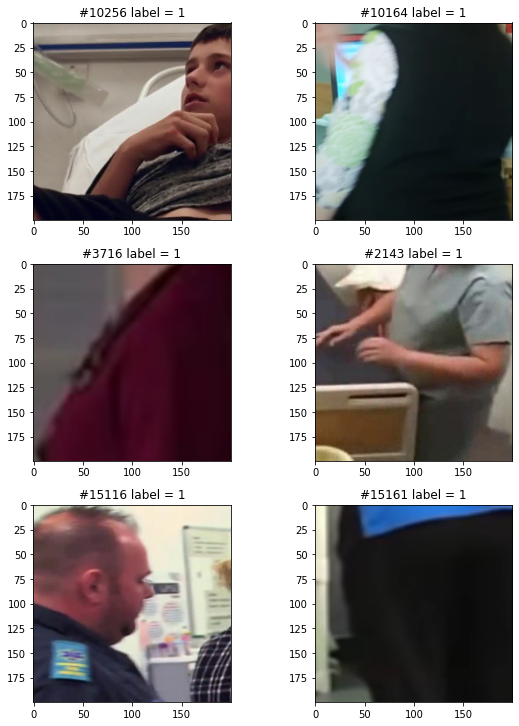

In [ ]:
def plotIDImage(img):
  img = img.permute(1,2,0)
  plt.imshow(img)


def ViewImageDate(num = 6):
  randoms = np.random.choice(train.index, num, replace=False)
  fig = plt.figure(figsize=(8, 20))

  for i in range(num):
    plt.subplot(num, 2, i + 1)
    random = randoms[i]
    img, label = ID[random]

    plotIDImage(img)
    plt.title(f"#{random} label = {label}")
  plt.tight_layout()
  
ViewImageDate()

In [ ]:
ImageLoader = torch.utils.data.DataLoader(ID, batch_size = 16, 
                                          sampler = torch.utils.data.SubsetRandomSampler(ID.getIndex())
                                          )
# TestLoader = torch.utils.data.DataLoader(testID, batch_size = 16)
for i in ImageLoader:
  X, y = i
  print(X.shape, y.shape)
  break

torch.Size([16, 3, 200, 200]) torch.Size([16])


how_many                    One
primary_posture        Standing
primary_occluded             No
staff_patient_other       Staff
Name: 6706, dtype: object


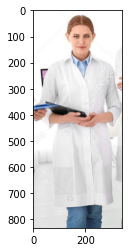

In [ ]:
im_num = np.random.randint(0,len(df))
im = plt.imread(zip_file.open(df.iloc[im_num].file_path))
print(df.iloc[im_num, 2:])
plt.imshow(im)

# Rest

In [ ]:
his = model.fit(train_gen, 
      steps_per_epoch=240,
      epochs=30,
      verbose = 1,
      validation_data = val_gen,
      validation_steps = 10,
      shuffle = True,
)

Epoch 1/10
20/20 [==============================] - 259s 13s/step - loss: 5.1038 - accuracy: 0.4453 - val_loss: 4.3077 - val_accuracy: 0.5406
Epoch 2/10
20/20 [==============================] - 360s 18s/step - loss: 3.2724 - accuracy: 0.5297 - val_loss: 2.6237 - val_accuracy: 0.5406
Epoch 3/10
20/20 [==============================] - 333s 17s/step - loss: 1.6745 - accuracy: 0.5703 - val_loss: 1.1016 - val_accuracy: 0.5844
Epoch 4/10
20/20 [==============================] - 299s 15s/step - loss: 1.1007 - accuracy: 0.5484 - val_loss: 1.1912 - val_accuracy: 0.6469
Epoch 5/10
20/20 [==============================] - 283s 14s/step - loss: 1.1584 - accuracy: 0.5578 - val_loss: 1.0538 - val_accuracy: 0.6219
Epoch 6/10
20/20 [==============================] - 242s 12s/step - loss: 1.0000 - accuracy: 0.5828 - val_loss: 1.0380 - val_accuracy: 0.6750
Epoch 7/10
20/20 [==============================] - 224s 11s/step - loss: 1.0389 - accuracy: 0.5766 - val_loss: 0.9424 - val_accuracy: 0.6250
Epoch 

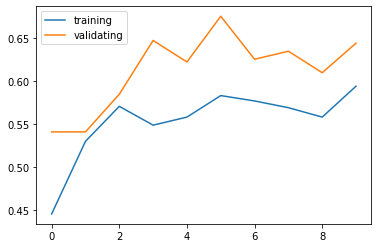

In [ ]:
plt.plot(his.history["accuracy"], label = "training")
plt.plot(his.history["val_accuracy"], label = "validating")
plt.legend()

Found 10204 non-validated image filenames belonging to 4 classes.
Found 1133 non-validated image filenames belonging to 4 classes.
(32,)


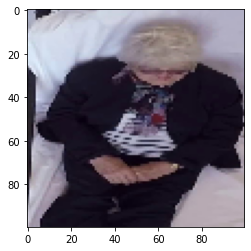

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
datagen = ImageDataGenerator(data_format="channels_last",
                             rescale = 1./255,
                             validation_split=0.1,
)
train_gen = datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "how_many",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "training",
                            shuffle=True,
                            target_size=(100, 100),
                            validate_filenames = False,
)
val_gen = datagen.flow_from_dataframe(train,
                            directory = "/content/drive/My Drive/M499/data",
                            x_col = "file_path",
                            y_col = "how_many",
                            class_mode="sparse",
                            batch_size = 32,
                            seed=42,
                            subset = "validation",
                            shuffle=True,
                            target_size=(100, 100),
                            validate_filenames = False,
)
for i in train_gen:
  img, label = i
  print(label.shape)
  plt.imshow((img[0,...]*255).astype(np.uint8))
  break

In [ ]:
from keras import layers
from keras import models
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100,100, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))
model.summary()

from tensorflow.keras import optimizers, losses
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-3),
    metrics=['accuracy'])

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
max_pooling2d_37 (MaxPooling (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 21, 21, 128)       73856     
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, 10, 10, 128)       0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 8, 8, 32)         

In [ ]:
his = model.fit(train_gen, 
      steps_per_epoch=20,
      epochs=10,
      verbose = 1,
      validation_data = val_gen,
      validation_steps = 10,
      shuffle = True,
)

Epoch 1/10
20/20 [==============================] - 16s 792ms/step - loss: 0.7860 - accuracy: 0.7031 - val_loss: 0.8355 - val_accuracy: 0.6687
Epoch 2/10
20/20 [==============================] - 16s 777ms/step - loss: 0.7776 - accuracy: 0.6953 - val_loss: 0.8465 - val_accuracy: 0.6781
Epoch 3/10
20/20 [==============================] - 16s 791ms/step - loss: 0.8446 - accuracy: 0.6656 - val_loss: 0.8526 - val_accuracy: 0.6625
Epoch 4/10
20/20 [==============================] - 16s 789ms/step - loss: 0.7925 - accuracy: 0.6969 - val_loss: 0.9087 - val_accuracy: 0.6375
Epoch 5/10
20/20 [==============================] - 16s 792ms/step - loss: 0.8371 - accuracy: 0.6781 - val_loss: 0.7734 - val_accuracy: 0.6938
Epoch 6/10
20/20 [==============================] - 16s 788ms/step - loss: 0.8297 - accuracy: 0.6906 - val_loss: 0.8767 - val_accuracy: 0.6562
Epoch 7/10
20/20 [==============================] - 16s 793ms/step - loss: 0.7794 - accuracy: 0.6984 - val_loss: 0.7921 - val_accuracy: 0.6719

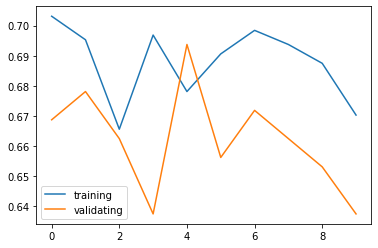

In [ ]:
plt.plot(his.history["accuracy"], label = "training")
plt.plot(his.history["val_accuracy"], label = "validating")
plt.legend()

In [ ]:
from keras import layers
from keras import models
model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100,100, 3)))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(4, activation='softmax'))
model.summary()

from tensorflow.keras import optimizers, losses
model.compile(loss=losses.SparseCategoricalCrossentropy(from_logits=False),
    optimizer=optimizers.Adam(learning_rate=1e-4, ),
    metrics=['accuracy'])

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_40 (Conv2D)           (None, 98, 98, 32)        896       
_________________________________________________________________
max_pooling2d_40 (MaxPooling (None, 49, 49, 32)        0         
_________________________________________________________________
conv2d_41 (Conv2D)           (None, 47, 47, 64)        18496     
_________________________________________________________________
max_pooling2d_41 (MaxPooling (None, 23, 23, 64)        0         
_________________________________________________________________
conv2d_42 (Conv2D)           (None, 21, 21, 128)       73856     
_________________________________________________________________
max_pooling2d_42 (MaxPooling (None, 10, 10, 128)       0         
_________________________________________________________________
conv2d_43 (Conv2D)           (None, 8, 8, 32)        

In [ ]:
his = model.fit(train_gen, 
      steps_per_epoch=20,
      epochs=10,
      verbose = 1,
      validation_data = val_gen,
      validation_steps = 10,
      shuffle = True,
)

Epoch 1/10
20/20 [==============================] - 16s 813ms/step - loss: 1.1213 - accuracy: 0.6594 - val_loss: 0.9431 - val_accuracy: 0.7063
Epoch 2/10
20/20 [==============================] - 16s 783ms/step - loss: 0.9252 - accuracy: 0.6953 - val_loss: 0.9618 - val_accuracy: 0.6469
Epoch 3/10
20/20 [==============================] - 16s 794ms/step - loss: 0.9231 - accuracy: 0.6891 - val_loss: 0.8502 - val_accuracy: 0.7281
Epoch 4/10
20/20 [==============================] - 16s 799ms/step - loss: 0.8736 - accuracy: 0.7156 - val_loss: 0.9651 - val_accuracy: 0.6750
Epoch 5/10
20/20 [==============================] - 16s 799ms/step - loss: 0.9782 - accuracy: 0.6516 - val_loss: 0.9785 - val_accuracy: 0.6531
Epoch 6/10
20/20 [==============================] - 16s 795ms/step - loss: 0.8902 - accuracy: 0.6906 - val_loss: 0.9605 - val_accuracy: 0.6719
Epoch 7/10
20/20 [==============================] - 16s 787ms/step - loss: 0.9162 - accuracy: 0.6828 - val_loss: 0.9235 - val_accuracy: 0.6719

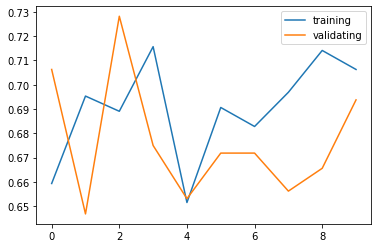

In [ ]:
plt.plot(his.history["accuracy"], label = "training")
plt.plot(his.history["val_accuracy"], label = "validating")
plt.legend()